In [7]:
import numpy as np
import sys
import matplotlib.pyplot as plt
%matplotlib notebook

%load_ext autoreload
%autoreload 2

In [120]:
sys.path.append("/Users/gup037/Codes/ESAM/")

from esam.esam import *
from esam.traces import mask_to_trace

In [55]:
nf = 8
trace1 = [[0, np.ones(1)] for i in range(nf)]
trace2 = [[-1, np.ones(1)] for i in range(nf)]; trace2[0][0] = 0
trace3 = [[0, np.ones(2)] for i in range(nf//2)] + [[-1, np.ones(2)] for i in range(nf//2)]; trace3[0][0] =0;
mytraces = [trace1, trace2, trace3]

In [56]:
trace1, trace2, trace3

([[0, array([1.])],
  [0, array([1.])],
  [0, array([1.])],
  [0, array([1.])],
  [0, array([1.])],
  [0, array([1.])],
  [0, array([1.])],
  [0, array([1.])]],
 [[0, array([1.])],
  [-1, array([1.])],
  [-1, array([1.])],
  [-1, array([1.])],
  [-1, array([1.])],
  [-1, array([1.])],
  [-1, array([1.])],
  [-1, array([1.])]],
 [[0, array([1., 1.])],
  [0, array([1., 1.])],
  [0, array([1., 1.])],
  [0, array([1., 1.])],
  [-1, array([1., 1.])],
  [-1, array([1., 1.])],
  [-1, array([1., 1.])],
  [-1, array([1., 1.])]])

In [142]:
def simulate_dm_mask(dm_pccc, nf=256, tres = 1, chw = 1.0, f0 = 700, pulse_end = 900, mynt = 1024):
    freqs = np.arange(f0, f0 + nf * chw, chw) #MHz
    freqs_hi = freqs + chw/2
    freqs_low = freqs - chw/2
    fmin = freqs[0]
    fmax = freqs[-1]
    delays_ms = 4.15e6 * dm_pccc * freqs**-2
    delays_upper_edge = 4.15e6 * dm_pccc * freqs_hi**-2
    delays_lower_edge = 4.15e6 * dm_pccc * freqs_low**-2
    delays_upper_edge -= delays_lower_edge[0]
    delays_ms -= delays_lower_edge[0]
    delays_lower_edge -= delays_lower_edge[0]
    
    delays_lower_edge = np.ceil(delays_lower_edge / tres).astype('int')
    delays_upper_edge = np.ceil(delays_upper_edge / tres).astype('int')
    dms_widths = (delays_lower_edge - delays_upper_edge)
    for ii, dmw in enumerate(dms_widths):
        if dmw < 1:
            dms_widths[ii] = 1
    
    delays_samples = np.rint(delays_ms / tres).astype('int')
    
    start = pulse_end
    frb = np.zeros((nf, mynt))
    for ichan in range(nf):
        frb[ichan, start + delays_samples[ichan] : start + delays_samples[ichan] + dms_widths[ichan]] = 1
        
    return frb
    
    

In [143]:
frb = simulate_dm_mask(100, 256)

<IPython.core.display.Javascript object>


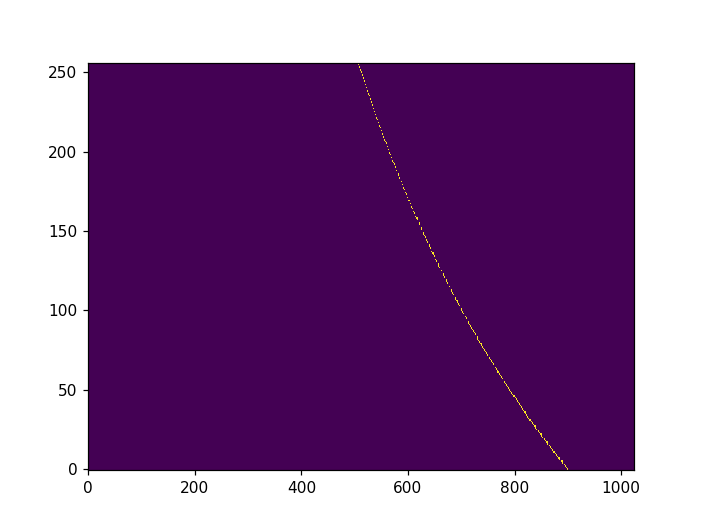

In [319]:
plt.figure()
plt.imshow(frb, aspect='auto', origin='lower', interpolation='None')

In [44]:
def trace_to_mask(trace):
    nchan = len(trace)
    min_pos = 0
    max_pos = 0
    curr_chan_start = 0
    for ichan in range(nchan):
        curr_chan_start += trace[ichan][0]
        print(ichan, curr_chan_start, trace[ichan][0])
        curr_chan_end = curr_chan_start + len(trace[ichan][1]) - 1
        
        if curr_chan_start < min_pos:
            min_pos = curr_chan_start
        if curr_chan_end > max_pos:
            max_pos = curr_chan_end
    print("min_pos, max_pos are", min_pos, max_pos)
    nt = max_pos - min_pos + 1
    mask = np.zeros((nchan, nt))
    start_pos = np.abs(min_pos)
    for ichan in range(nchan):
        kernel = trace[ichan][1]
        start_pos += trace[ichan][0]   #will be 0 for chan0 by definition
        mask[ichan, start_pos:start_pos + len(kernel)] = kernel
        
    return mask

        

0 0 0
1 0 0
2 0 0
3 0 0
4 0 0
5 0 0
6 0 0
7 0 0
min_pos, max_pos are 0 0


<IPython.core.display.Javascript object>


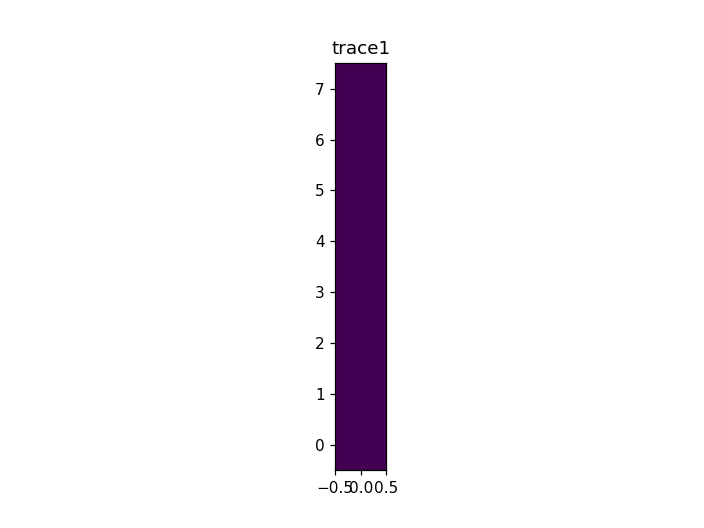

0 0 0
1 -1 -1
2 -2 -1
3 -3 -1
4 -4 -1
5 -5 -1
6 -6 -1
7 -7 -1
min_pos, max_pos are -7 0


<IPython.core.display.Javascript object>


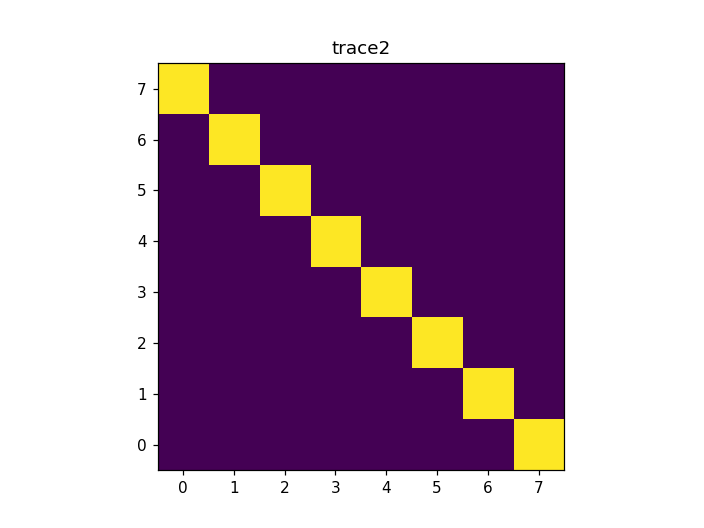

0 0 0
1 0 0
2 0 0
3 0 0
4 -1 -1
5 -2 -1
6 -3 -1
7 -4 -1
min_pos, max_pos are -4 1


<IPython.core.display.Javascript object>


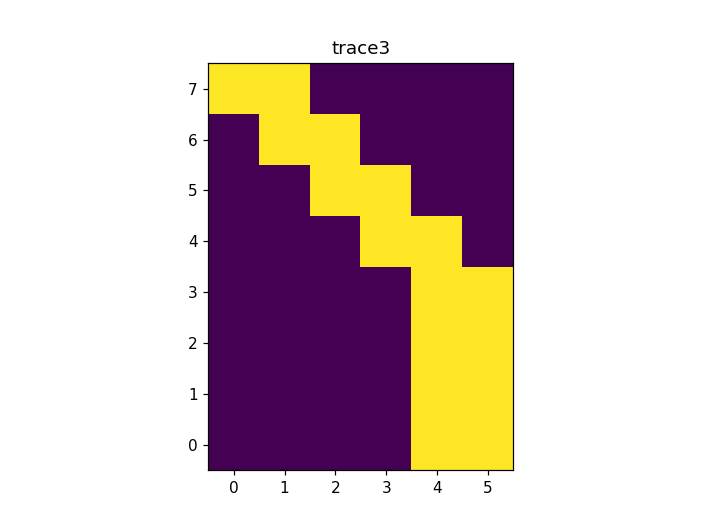

In [92]:
mymasks = []
for ii, trace in enumerate(mytraces):
    mymasks.append(trace_to_mask(trace))
    plt.figure()
    plt.imshow(mymasks[-1], origin='lower')
    plt.title(f"trace{ii+1}")

In [71]:
tree = EsamTree(nf)

In [91]:
tree.get_trace_pid(trace2);
tree.total_products

self.nchan = 1, self._ichan = 0, trace = [[0, array([1.])]], mid_offset = None, offsets_added_so_far=None
self.nchan = 1, self._ichan = 1, trace = [[-1, array([1.])]], mid_offset = None, offsets_added_so_far=None
Returning osum = 0
self.nchan = 2, self._ichan = 0, trace = [[0, array([1.])], [-1, array([1.])]], mid_offset = -1, offsets_added_so_far=0
self.nchan = 1, self._ichan = 2, trace = [[-1, array([1.])]], mid_offset = None, offsets_added_so_far=None
self.nchan = 1, self._ichan = 3, trace = [[-1, array([1.])]], mid_offset = None, offsets_added_so_far=None
Returning osum = 0
self.nchan = 2, self._ichan = 1, trace = [[-1, array([1.])], [-1, array([1.])]], mid_offset = -1, offsets_added_so_far=0
Returning osum = -1
self.nchan = 4, self._ichan = 0, trace = [[0, array([1.])], [-1, array([1.])], [-1, array([1.])], [-1, array([1.])]], mid_offset = -1, offsets_added_so_far=-1
self.nchan = 1, self._ichan = 4, trace = [[-1, array([1.])]], mid_offset = None, offsets_added_so_far=None
self.nch

37

In [93]:
tree(mymasks[1])

self.nchan is 2, self._ichan is 0, prod.offset is 0
upper is [[0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 1. 0.]]
lower is [[0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0.]]
dout  is [[0. 0. 0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0.]]
self.nchan is 2, self._ichan is 0, prod.offset is -1
upper is [[0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 1. 0.]]
lower is [[0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0.]]
dout  is [[0. 0. 0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 2.]
 [0. 0. 0. 0. 0. 0. 0. 0.]]
self.nchan is 2, self._ichan is 0, prod.offset is 0
upper is [[0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1. 1. 0.]]
lower is [[0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0.]]
dout  is [[0. 0. 0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 2.]
 [0. 0. 0. 0. 0. 1. 2. 0.]]
self.nchan is 2, self._ichan is 1, prod.offset is 0
upper is [[0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 1. 0. 0. 0.]]
lower is [[0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 1. 0. 0.]]
dout  

array([[1., 1., 1., 1., 1., 1., 1., 1.],
       [0., 0., 0., 0., 0., 0., 0., 8.],
       [0., 0., 0., 4., 6., 2., 2., 0.]])

In [84]:
sum_offsets(trace3)

Returning osum = -4


-4

mask_to_trace got mask =
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
mask_to_trace is returning trace [[0, array([1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1.])], [-4, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-4, array([1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-4, array([1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1.])], [-4, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-4, array([1., 1., 1., 1.])], [-5, array([1., 1., 1., 1., 1.])], [-4, array([1., 1., 1., 1.])], [-5, array([1., 1., 1., 1.])], [-4, array([1., 1., 1., 1., 1.])], [-5, array([1., 1., 1., 1.])], [-4, array([1., 1., 1., 1., 1.])], [-4, array([1., 1

<IPython.core.display.Javascript object>


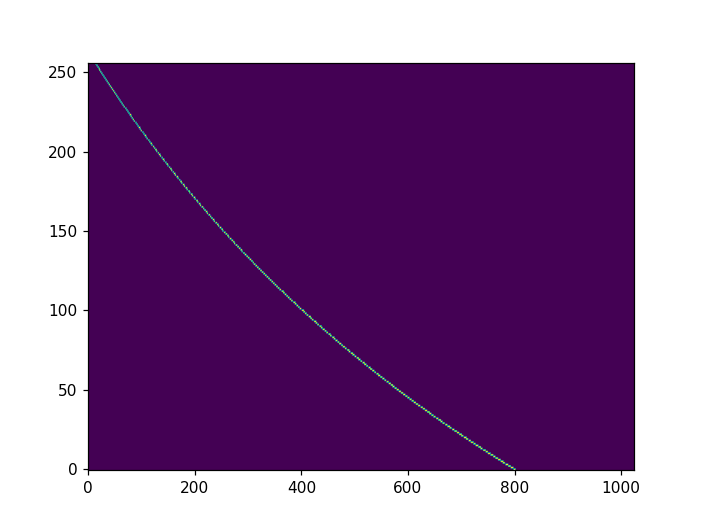

In [318]:
nf = 256
tree = EsamTree(nf)
#dms = [3]
#dms = [4]
#dms = [3, 4]
dms = [200]
inps = []
for idm in dms:
    dm_mask = simulate_dm_mask(idm, nf = nf, pulse_end = 800, mynt = 1024)
    trace = mask_to_trace(dm_mask)
    reverted_mask = trace_to_mask(trace)
    plt.figure()
    plt.imshow(dm_mask, origin = 'lower', aspect='auto')
    inps.append(dm_mask.sum())
    #plt.figure()
    #plt.imshow(reverted_mask, alpha=0.5)
plt.show()

In [307]:
nf = 8
tree = EsamTree(nf)
#dms = [3]
#dms = [4]
#dms = [3, 4]
dms = np.arange(50)
for idm in dms:
    print(idm)
    dm_mask = simulate_dm_mask(idm, nf = nf, pulse_end = 80, mynt = 100)
    #plt.figure()
    #plt.imshow(dm_mask, aspect='auto', origin='lower')
    trace = mask_to_trace(dm_mask)
    tree.get_trace_pid(trace)
    

0
mask_to_trace got mask =
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

In [308]:
tree.nprod

27

In [309]:
all_pids = [[], [], [], []]
tree.get_all_pids(all_pids)
all_pids

[[EndProduct kernel=[1.],
  EndProduct kernel=[1.],
  EndProduct kernel=[1. 1.],
  EndProduct kernel=[1.],
  EndProduct kernel=[1. 1.],
  EndProduct kernel=[1.],
  EndProduct kernel=[1.],
  EndProduct kernel=[1.],
  EndProduct kernel=[1.],
  EndProduct kernel=[1.]],
 [l0_u0_o0,
  l0_u0_o-1,
  l1_u0_o-2,
  l0_u0_o0,
  l0_u0_o-1,
  l0_u1_o-1,
  l0_u0_o0,
  l0_u0_o-1,
  l0_u0_o0,
  l0_u0_o-1],
 [l0_u0_o0,
  l0_u1_o0,
  l1_u0_o-1,
  l0_u0_o-1,
  l1_u1_o-1,
  l1_u0_o-2,
  l0_u1_o-1,
  l1_u1_o-2,
  l1_u2_o-2,
  l2_u1_o-3,
  l0_u0_o0,
  l0_u1_o0,
  l0_u0_o-1,
  l1_u0_o-1,
  l1_u1_o-1,
  l1_u0_o-2,
  l1_u1_o-2],
 [l0_u0_o0,
  l0_u1_o0,
  l0_u2_o0,
  l0_u0_o-1,
  l1_u0_o-1,
  l2_u1_o-1,
  l2_u3_o-1,
  l2_u2_o-1,
  l3_u1_o-2,
  l3_u3_o-2,
  l4_u3_o-2,
  l4_u2_o-2,
  l4_u4_o-2,
  l4_u5_o-2,
  l4_u3_o-3,
  l5_u3_o-3,
  l5_u6_o-3,
  l5_u4_o-3,
  l5_u5_o-3,
  l6_u5_o-3,
  l6_u7_o-3,
  l6_u6_o-4,
  l6_u4_o-4,
  l6_u5_o-4,
  l6_u7_o-4,
  l6_u8_o-4,
  l6_u9_o-4]]

In [310]:
esam_out = []
for ii, idm in enumerate(dms):
    print(ii, idm)
    dm_mask = simulate_dm_mask(idm, nf = nf, pulse_end = 80, mynt = 100)
    esam_result = tree(dm_mask);
    print(esam_result.shape)
    esam_out.append(esam_result)
    #esam_out[ii, ...] = tree(dm_mask)

0 0
self.nchan is 2, self._ichan is 0, prod.offset is 0
upper is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]]
lower is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]]
dout  is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

dout  is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 3. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

self.nchan is 2, self._ichan is 0, prod.offset is 0
upper is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]]
lower is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]]
dout  is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



dout  is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 1. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 3. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 2. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

dout  is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 1. 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 3. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 1. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

upper is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 2. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 1. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 3. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



dout  is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 2. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 1. 1. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

upper is [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 2. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 1. 1. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<IPython.core.display.Javascript object>


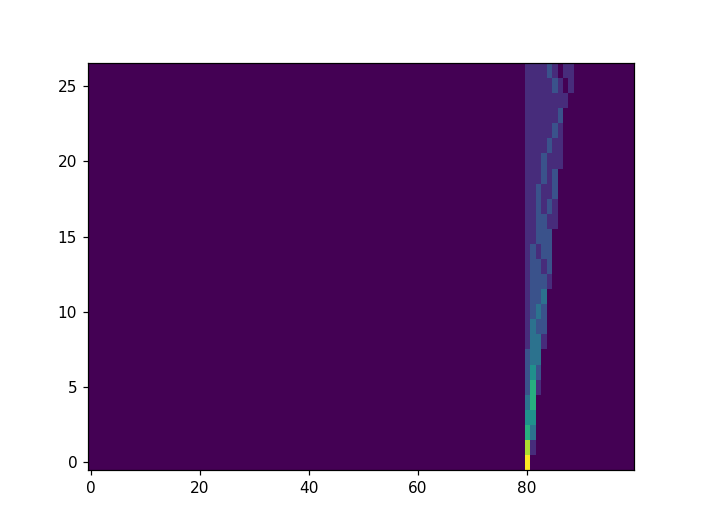

<IPython.core.display.Javascript object>


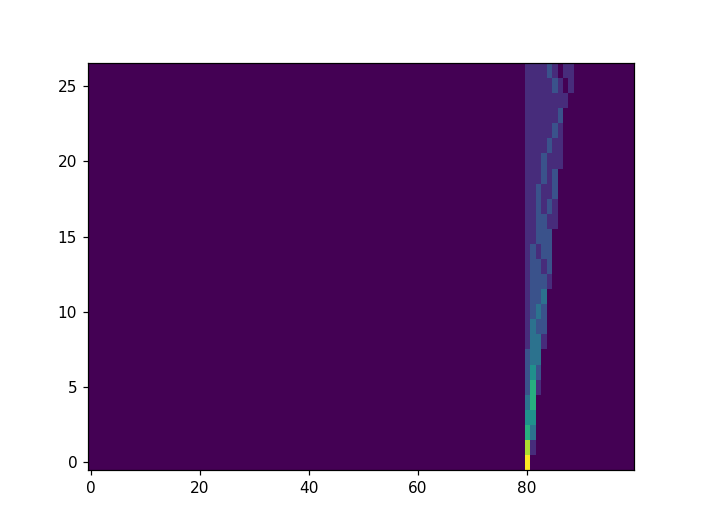

<IPython.core.display.Javascript object>


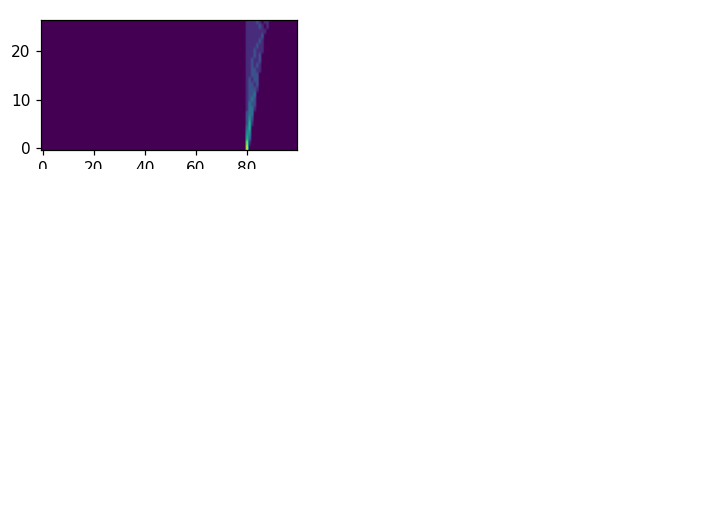

<IPython.core.display.Javascript object>


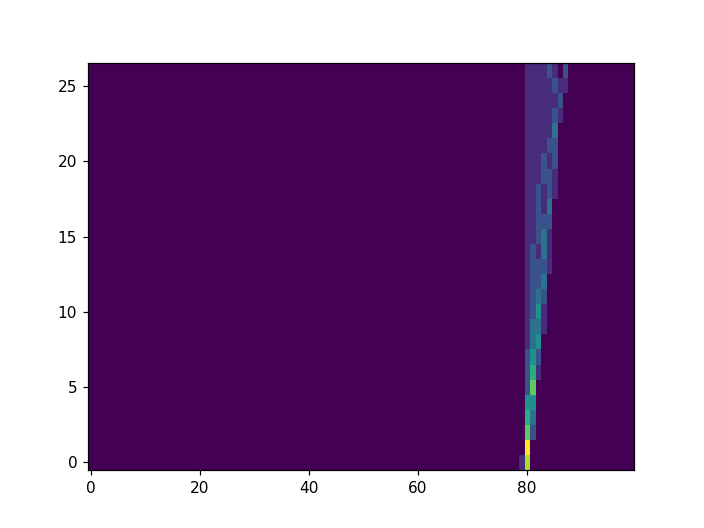

<IPython.core.display.Javascript object>


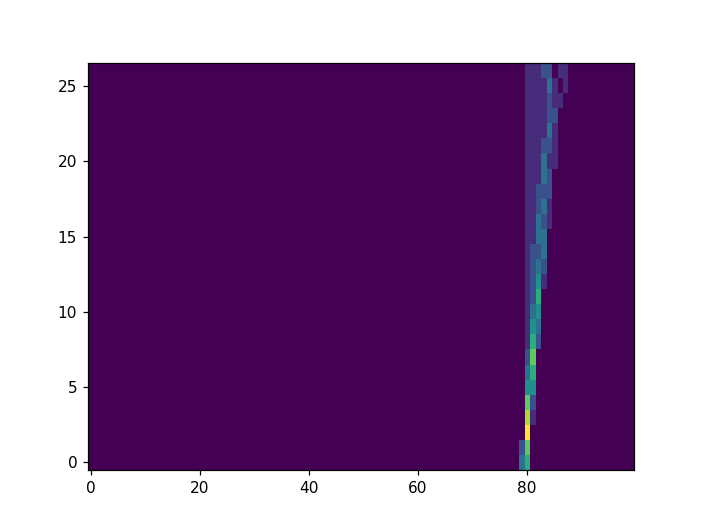

<IPython.core.display.Javascript object>


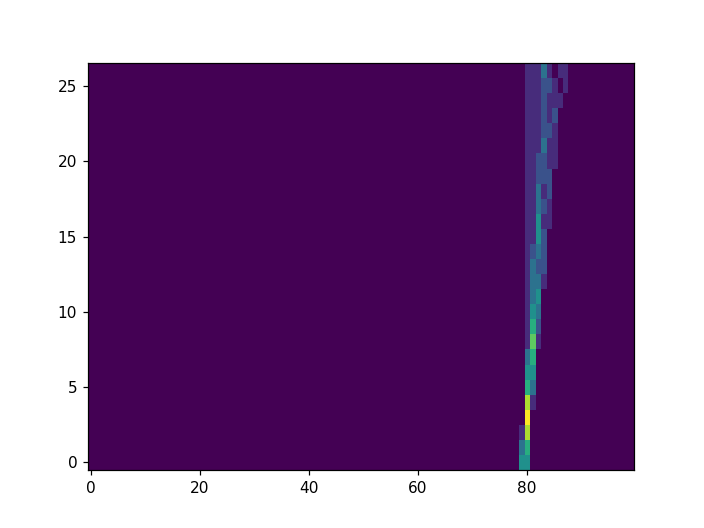

<IPython.core.display.Javascript object>


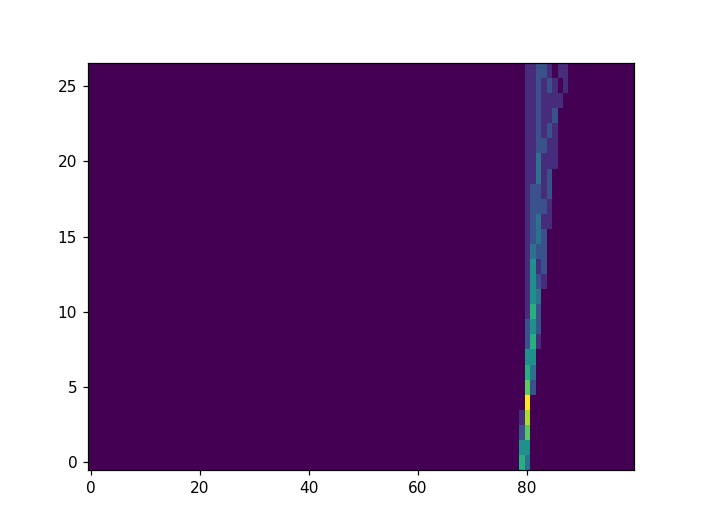

<IPython.core.display.Javascript object>


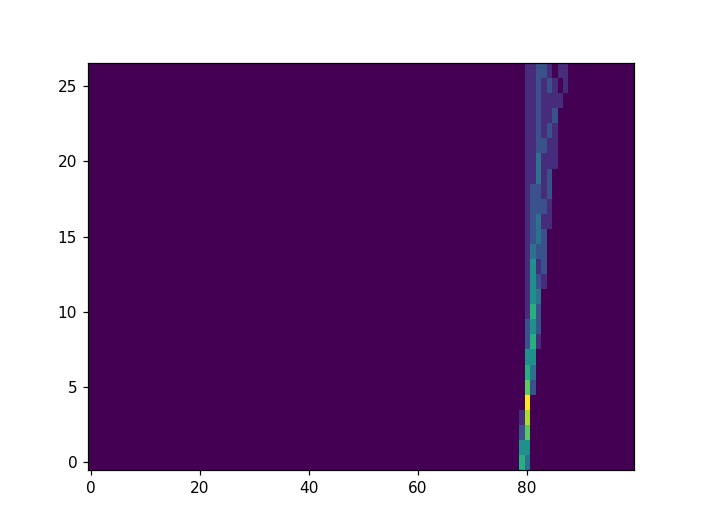

<IPython.core.display.Javascript object>


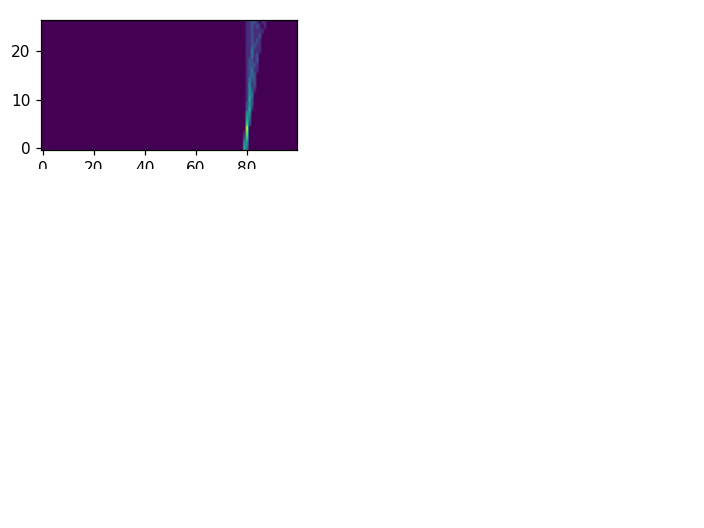

<IPython.core.display.Javascript object>


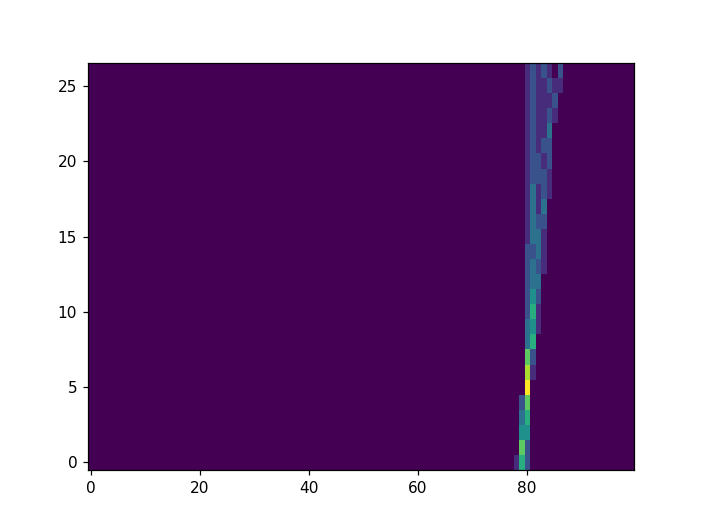

<IPython.core.display.Javascript object>


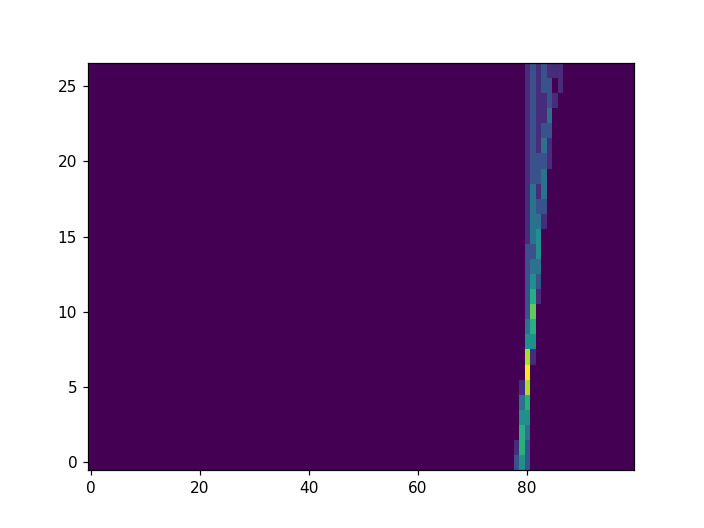

<IPython.core.display.Javascript object>


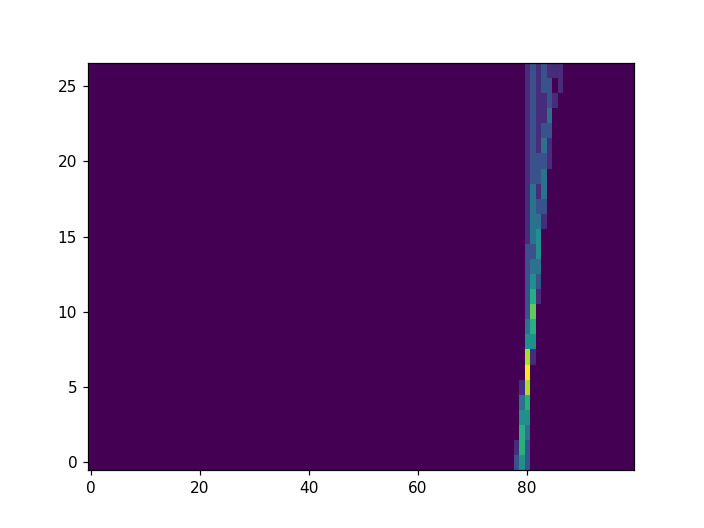

<IPython.core.display.Javascript object>


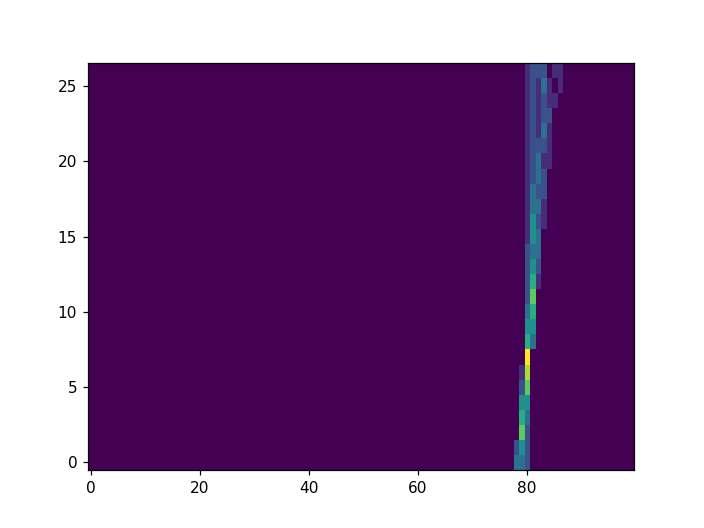

<IPython.core.display.Javascript object>


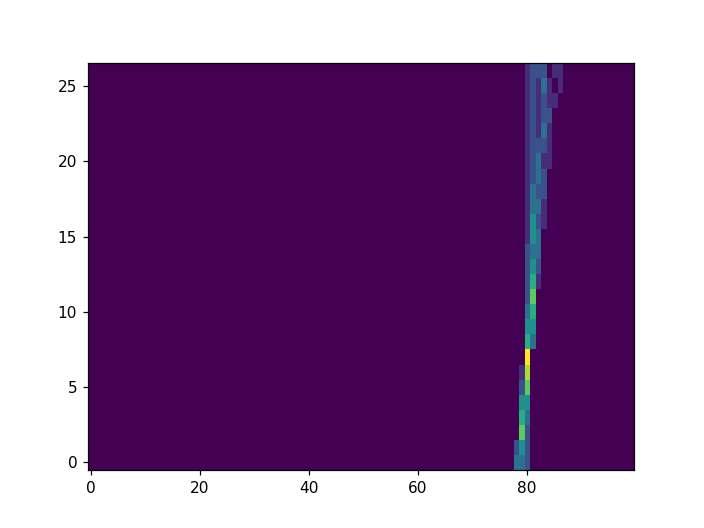

<IPython.core.display.Javascript object>


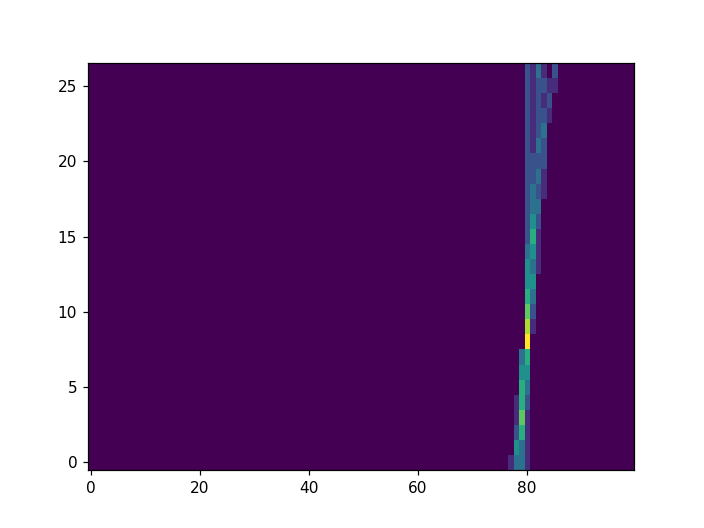

<IPython.core.display.Javascript object>


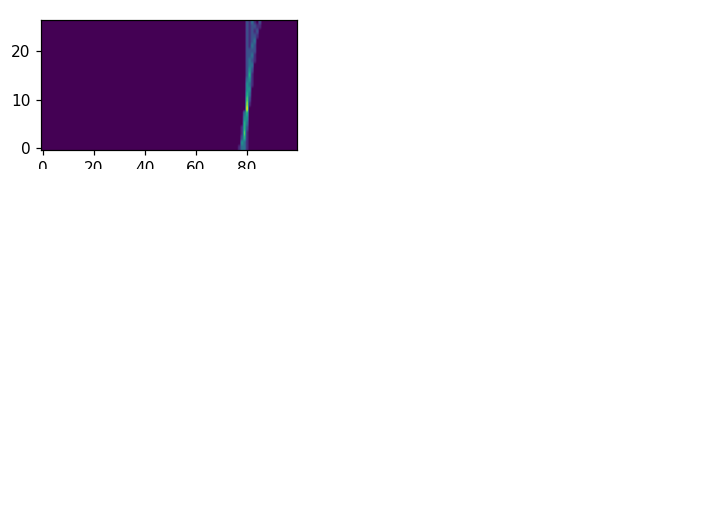

<IPython.core.display.Javascript object>


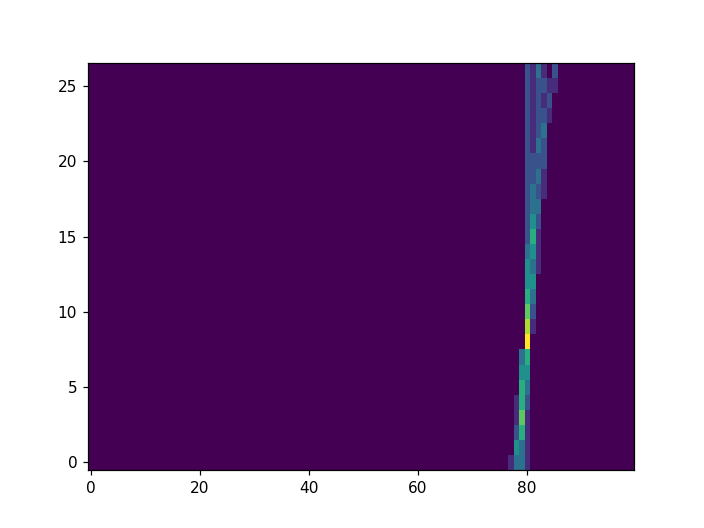

<IPython.core.display.Javascript object>


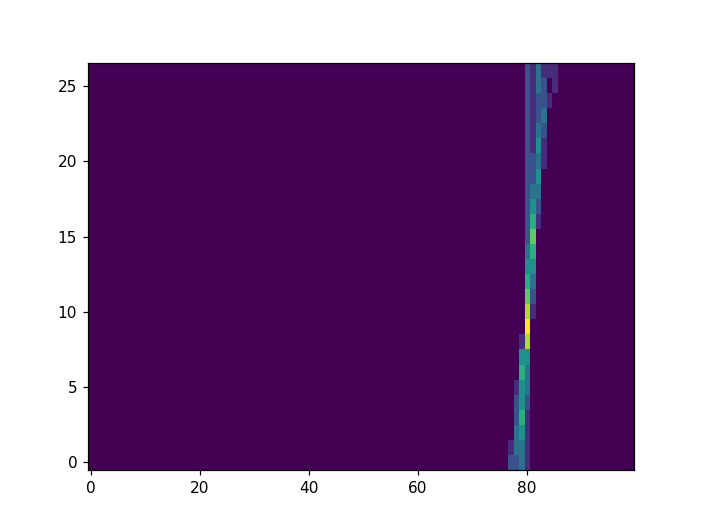

<IPython.core.display.Javascript object>


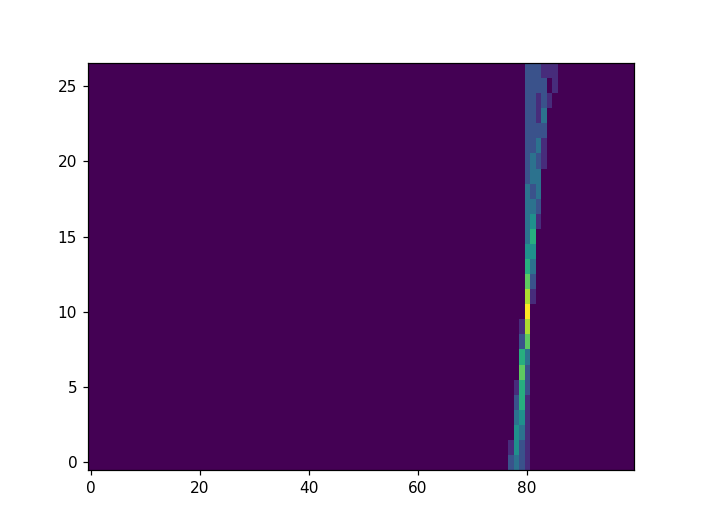

<IPython.core.display.Javascript object>


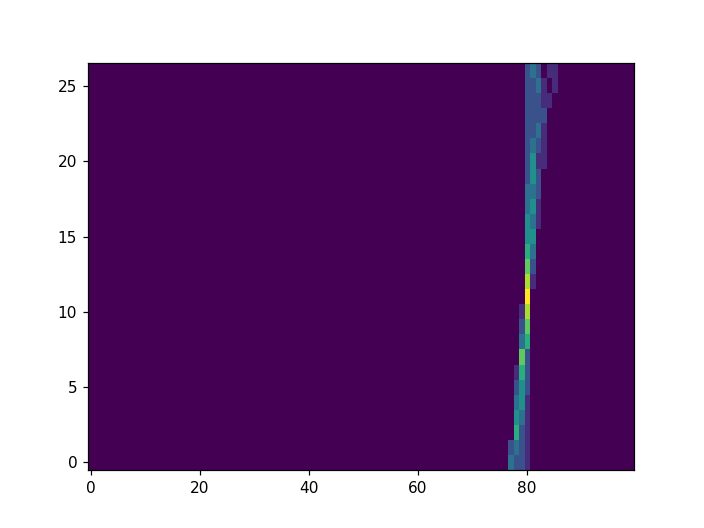

<IPython.core.display.Javascript object>


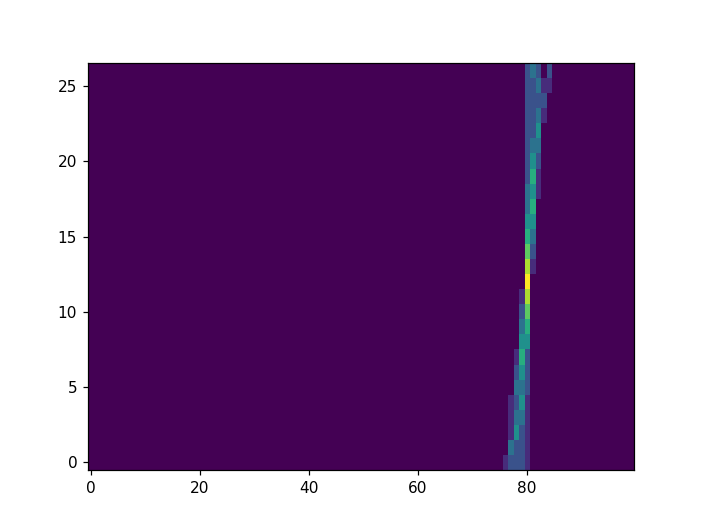

<IPython.core.display.Javascript object>


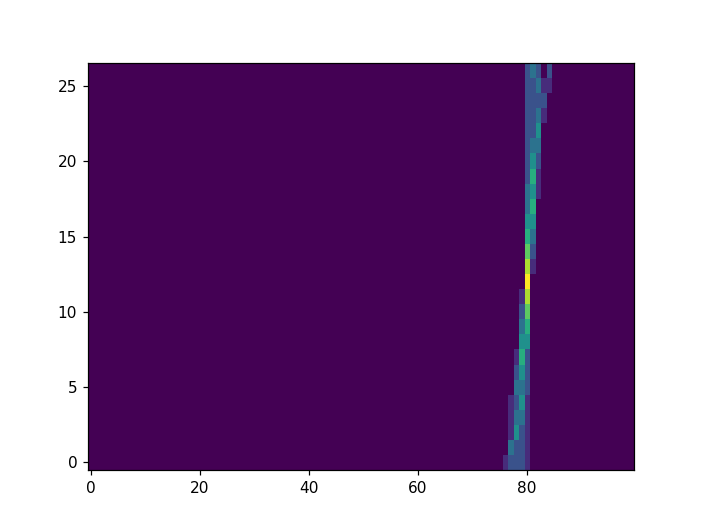

<IPython.core.display.Javascript object>


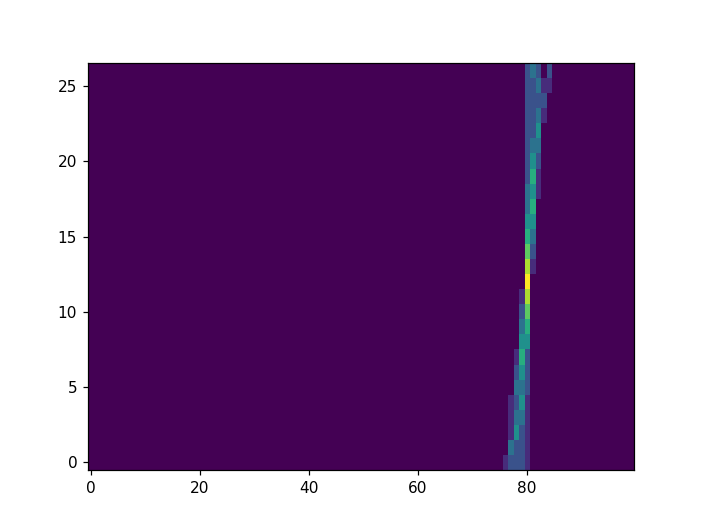

<IPython.core.display.Javascript object>


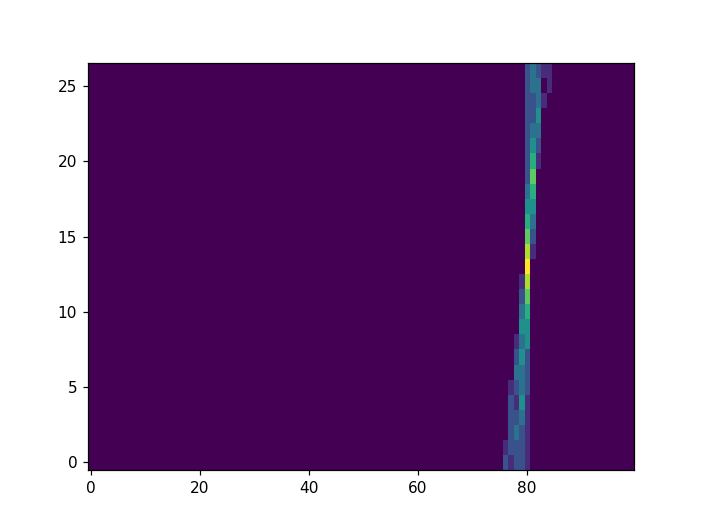

<IPython.core.display.Javascript object>


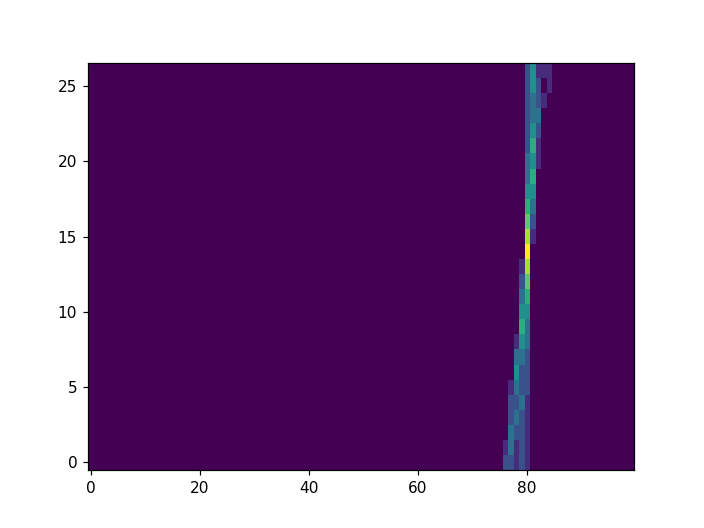

<IPython.core.display.Javascript object>


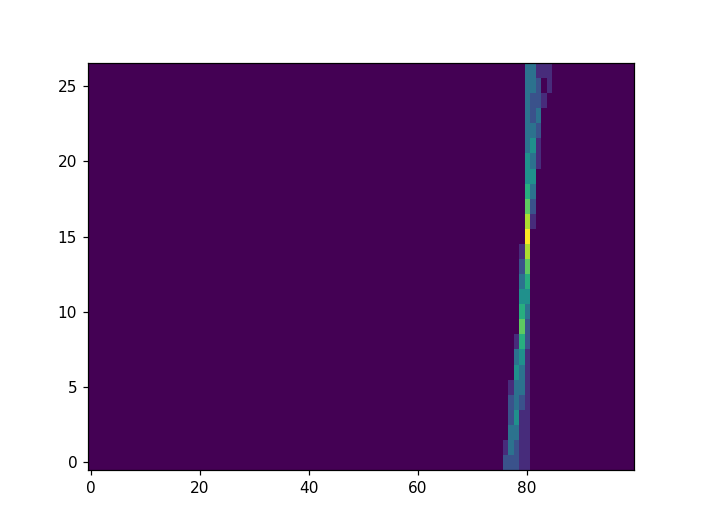

<IPython.core.display.Javascript object>


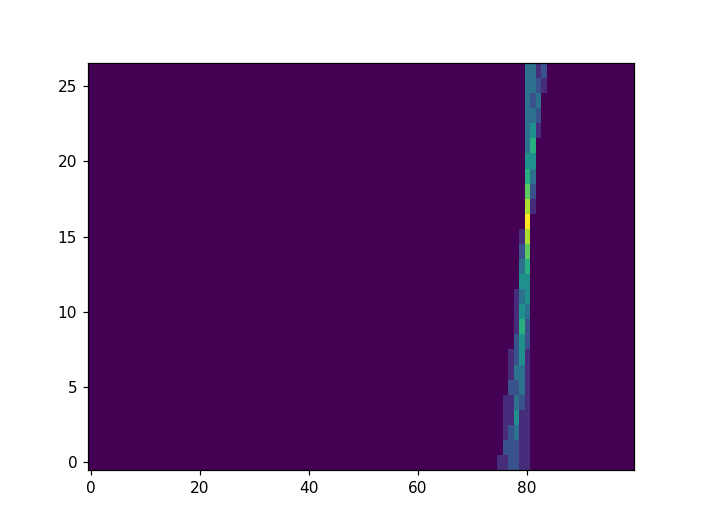

<IPython.core.display.Javascript object>


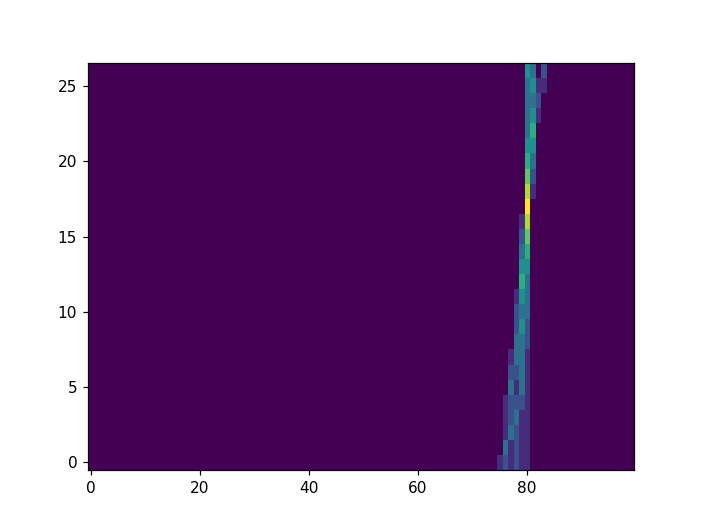

<IPython.core.display.Javascript object>


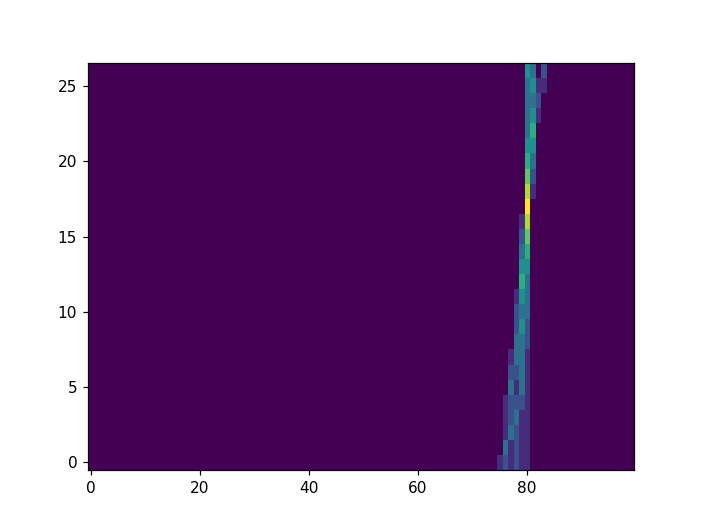

<IPython.core.display.Javascript object>


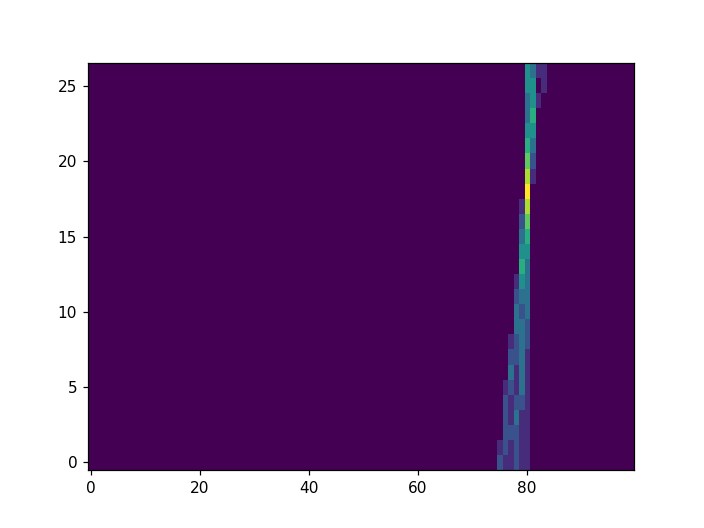

<IPython.core.display.Javascript object>


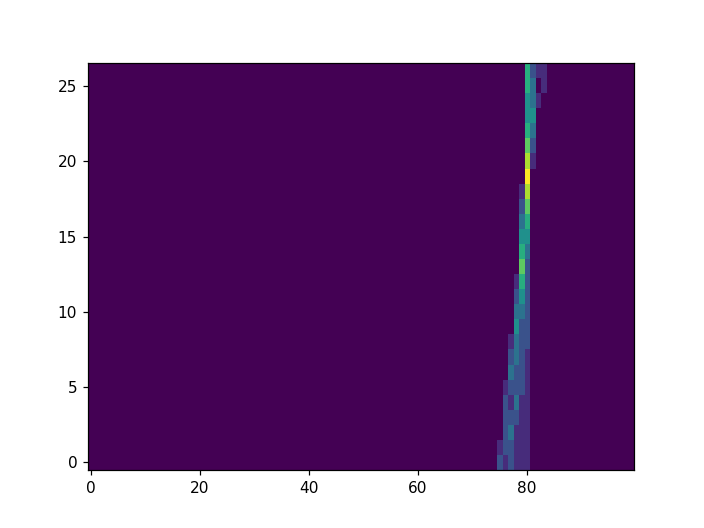

<IPython.core.display.Javascript object>


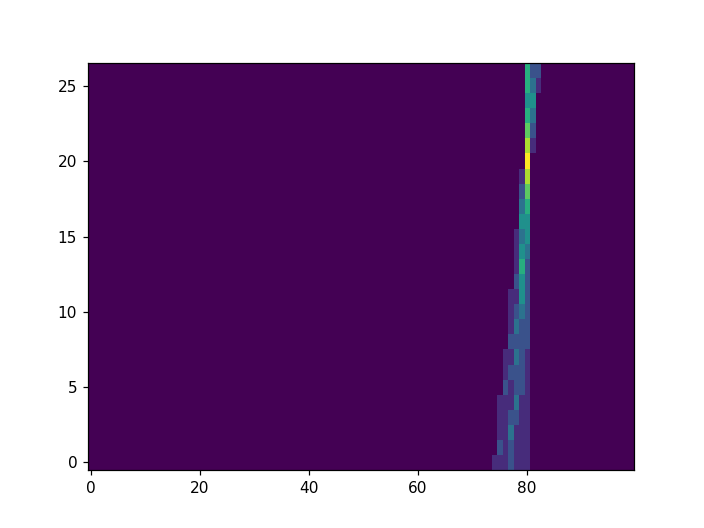

<IPython.core.display.Javascript object>


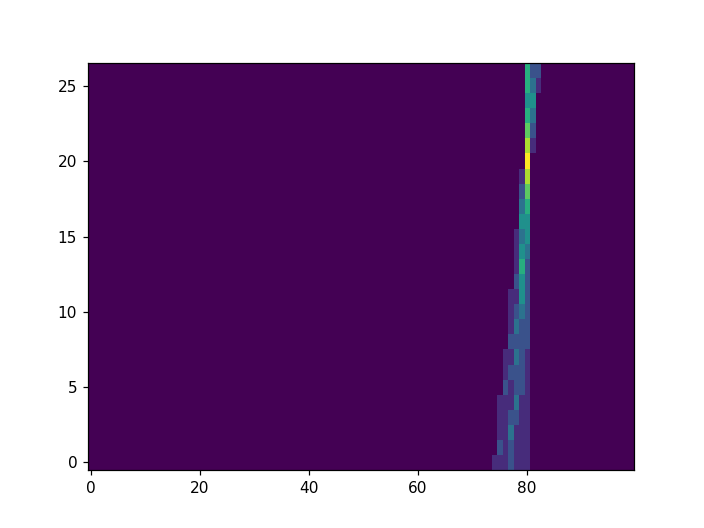

<IPython.core.display.Javascript object>


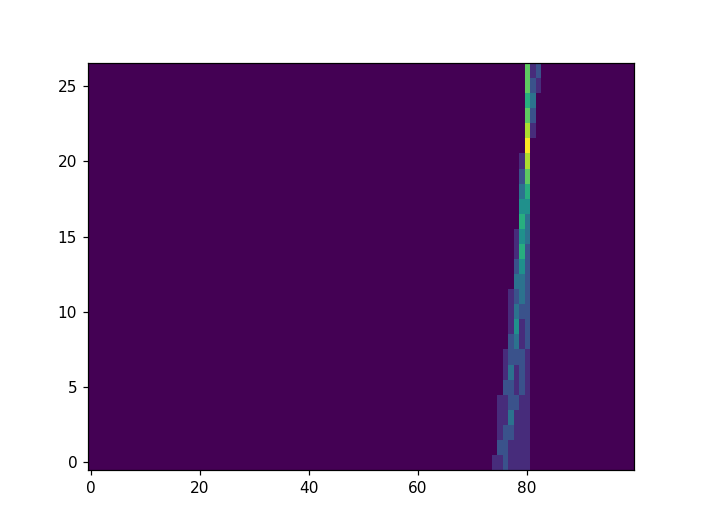

<IPython.core.display.Javascript object>


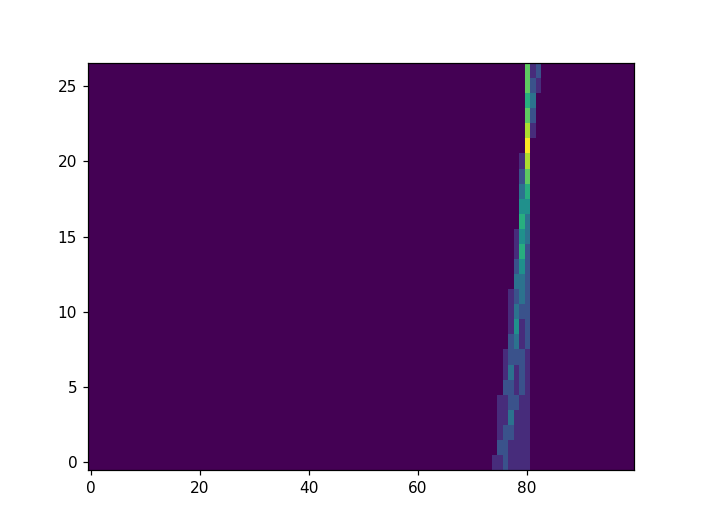

<IPython.core.display.Javascript object>


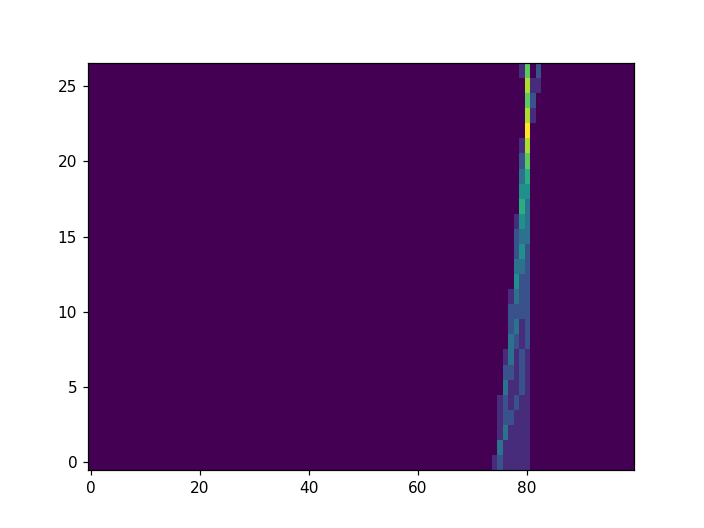

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


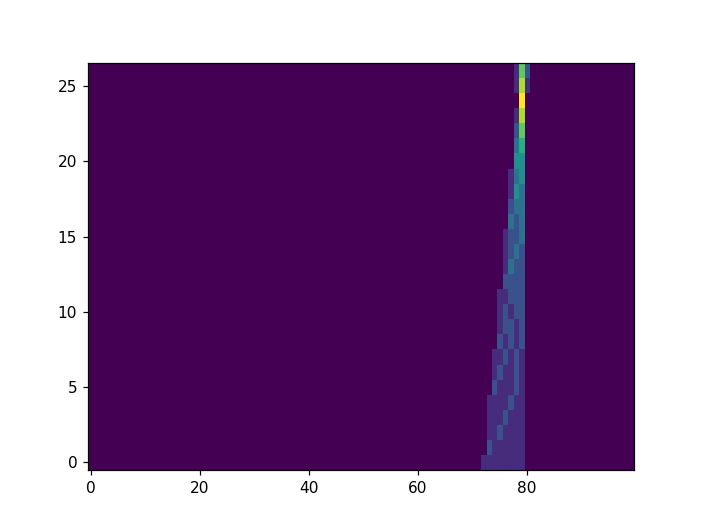

<IPython.core.display.Javascript object>


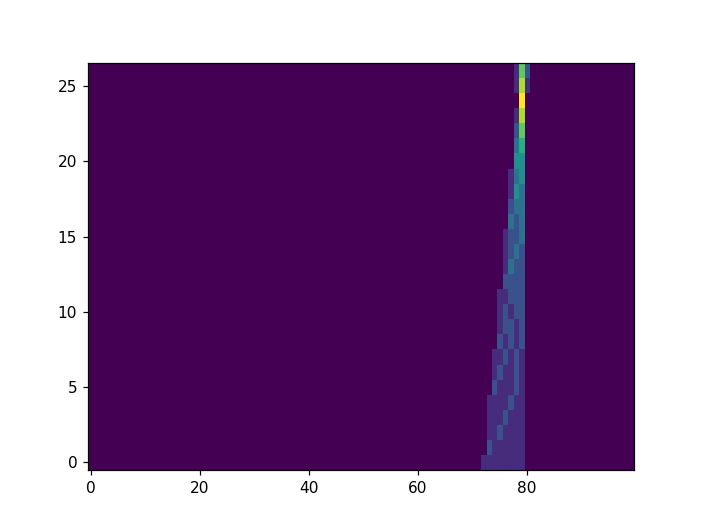

<IPython.core.display.Javascript object>


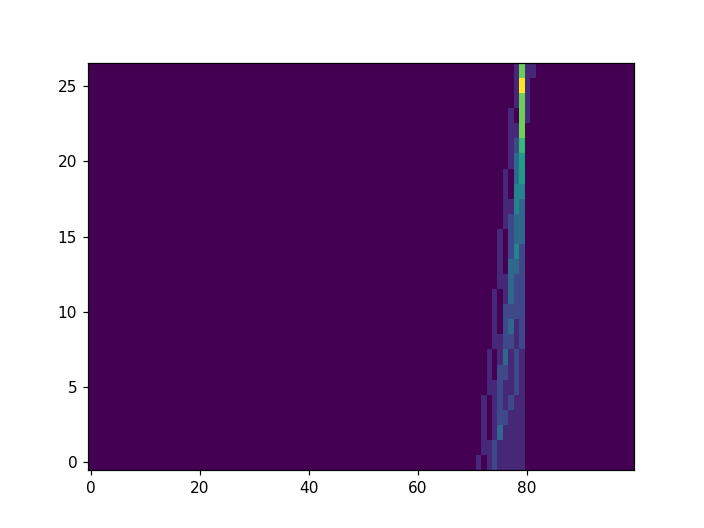

<IPython.core.display.Javascript object>


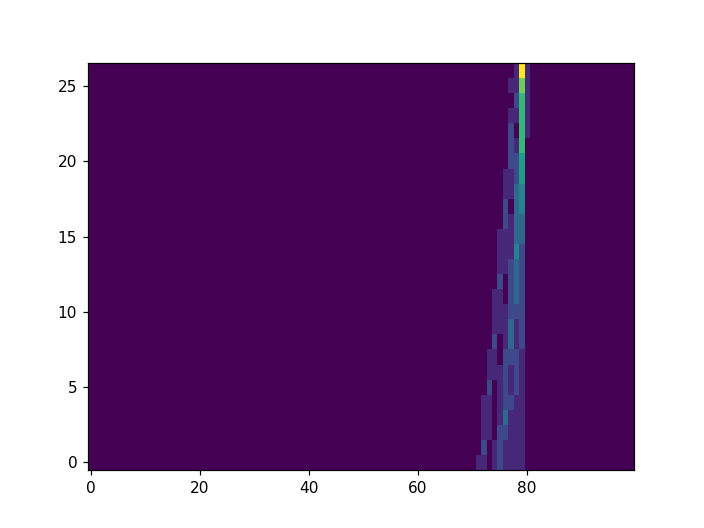

In [311]:
for out in esam_out:
    plt.figure()
    plt.imshow(out, aspect='auto', origin='lower')
    

In [315]:
for ii in range(len(esam_out)):
    print(esam_out[ii].max(), inps[ii])

8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
8.0 8.0
9.0 9.0
9.0 9.0


In [292]:
tree._products

[l0_u0_o0, l0_u1_o0]

In [293]:
tree._products

[l0_u0_o0, l0_u1_o0]

In [294]:
tree.lower._products, tree.upper._products

([l0_u0_o0], [l0_u0_o0, l1_u1_o-1])

In [295]:
tree.lower.upper._products, tree.lower.lower._products, tree.upper.upper._products, tree.upper.lower._products

([l0_u0_o0], [l0_u0_o0], [l0_u0_o-1, l0_u0_o0], [l0_u0_o0, l0_u0_o-1])

In [296]:
tree.lower.upper.lower._products

[EndProduct kernel=[1.]]